In [1]:
# Packages
import pandas as pd
import matplotlib.pyplot as plt
from numpy import linspace, array, ndarray, nan

In [2]:
# ====================================== Plot features ========================================== #
# Properties to decorate the plots.
plt.rcParams['axes.linewidth'] = 0.5
plt.rcParams['text.usetex'] = False
plt.rcParams['font.family'] = 'serif'   
plt.rcParams['font.sans-serif'] = 'New Century Schoolbook' # 'Times', 'Liberation Serif', 'Times New Roman'
#plt.rcParams['font.serif'] = ['Helvetica']
plt.rcParams['font.size'] = 10   # Antes era 15
plt.rcParams['legend.frameon'] = False
plt.rcParams['legend.edgecolor'] = 'k'
plt.rcParams['legend.markerscale'] = 1
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.visible'] = True
plt.rcParams['xtick.top'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.major.width']= 0.5
plt.rcParams['xtick.major.size']= 5.0
plt.rcParams['xtick.minor.width']= 0.5
plt.rcParams['xtick.minor.size']= 3.0
plt.rcParams['ytick.major.width']= 0.5
plt.rcParams['ytick.major.size']= 5.0
plt.rcParams['ytick.minor.width']= 0.5
plt.rcParams['ytick.minor.size']= 3.0
# =============================================================================================== #

In [3]:
# Demand: it is a power law function
def Q(parameters : ndarray, p : ndarray, p_base : float) -> ndarray:
    # Parameters to fit
    Q_base, e = parameters[0], parameters[1]
    
    return Q_base*(p/p_base)**e

In [4]:
df_products = pd.read_csv('../data/final_datasets/cleaned_datasets/eci_product_master_standardized_clean.csv')

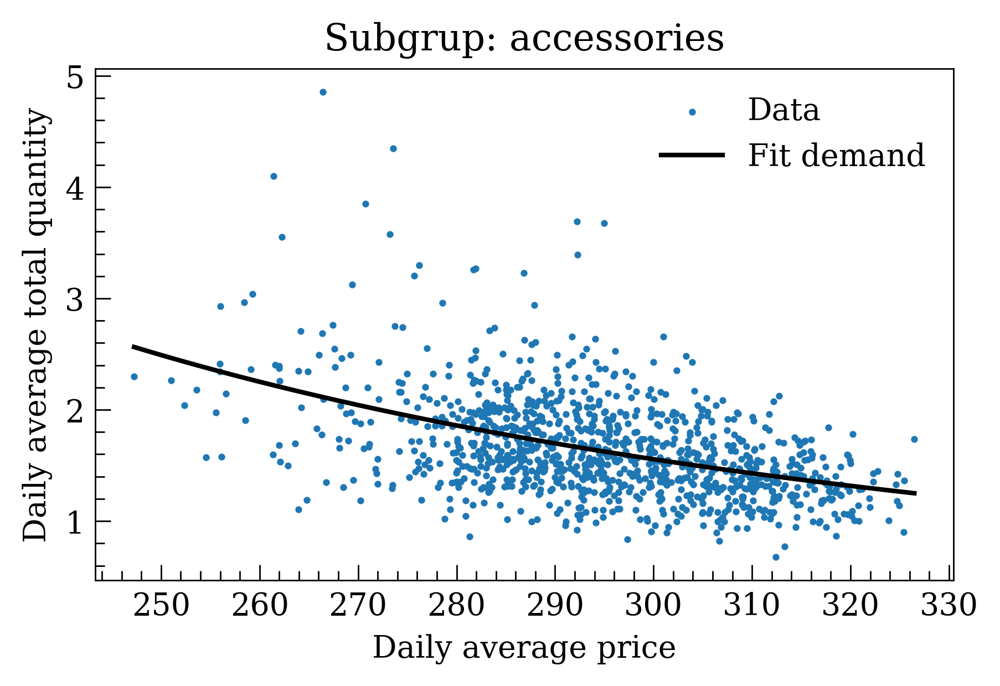

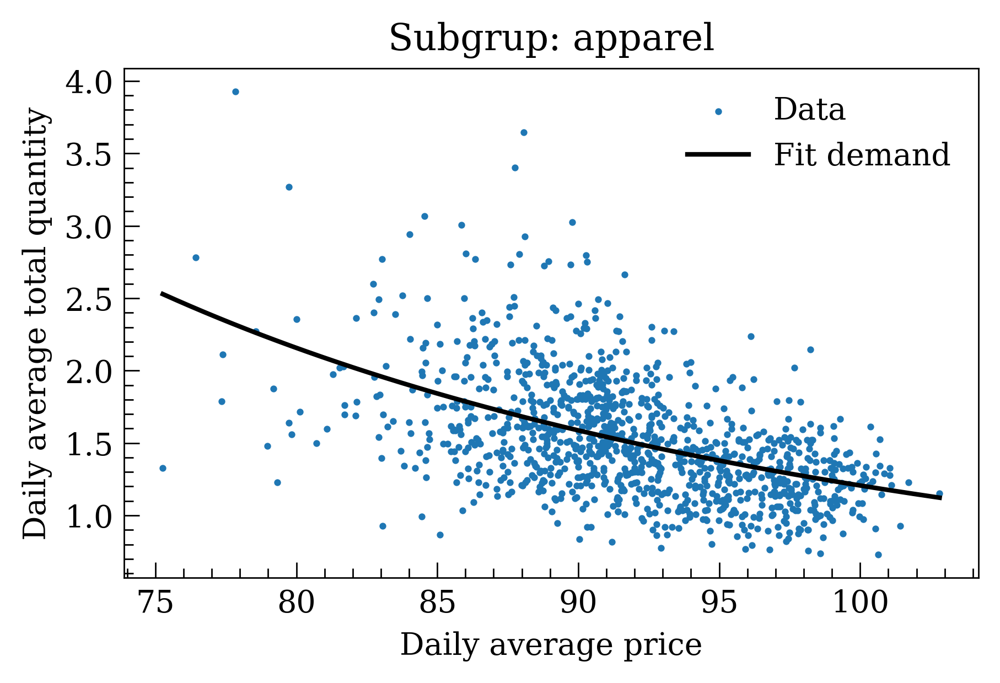

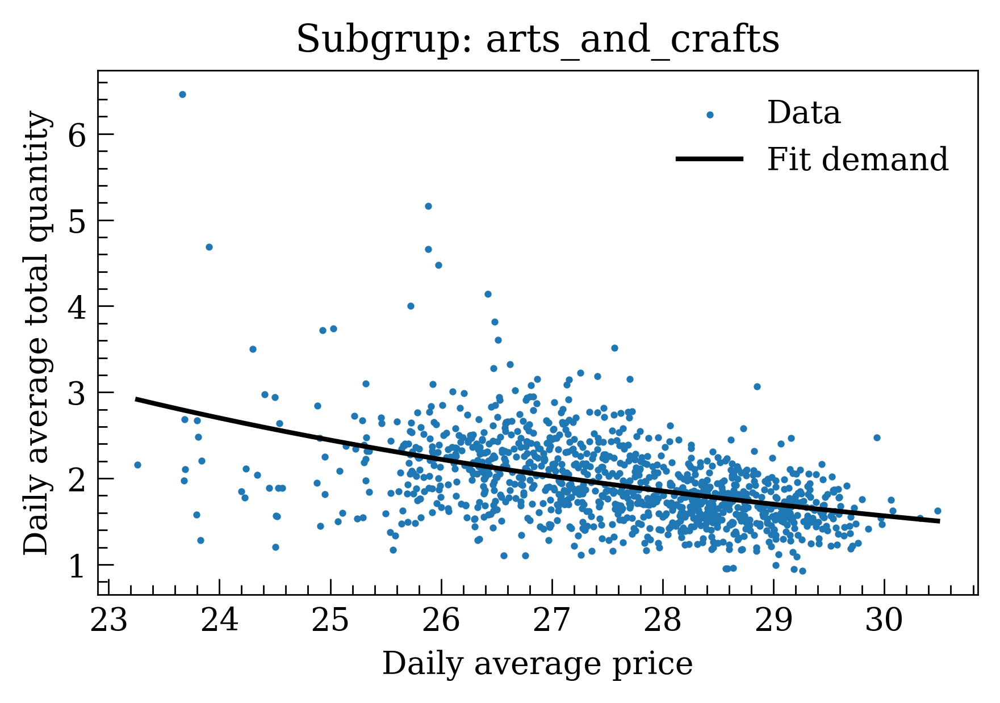

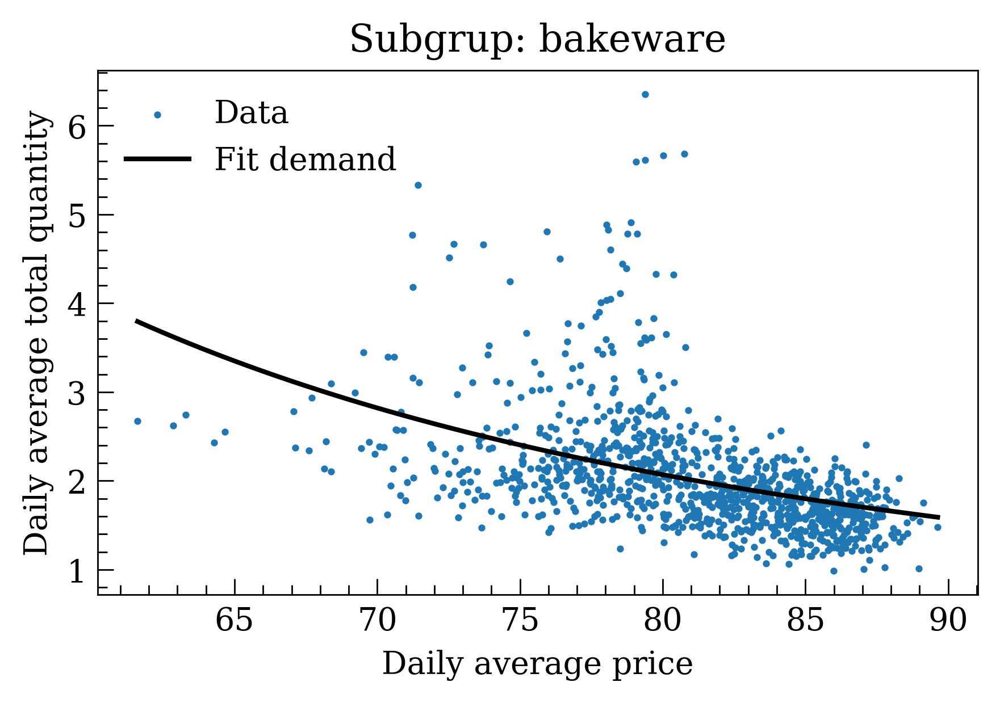

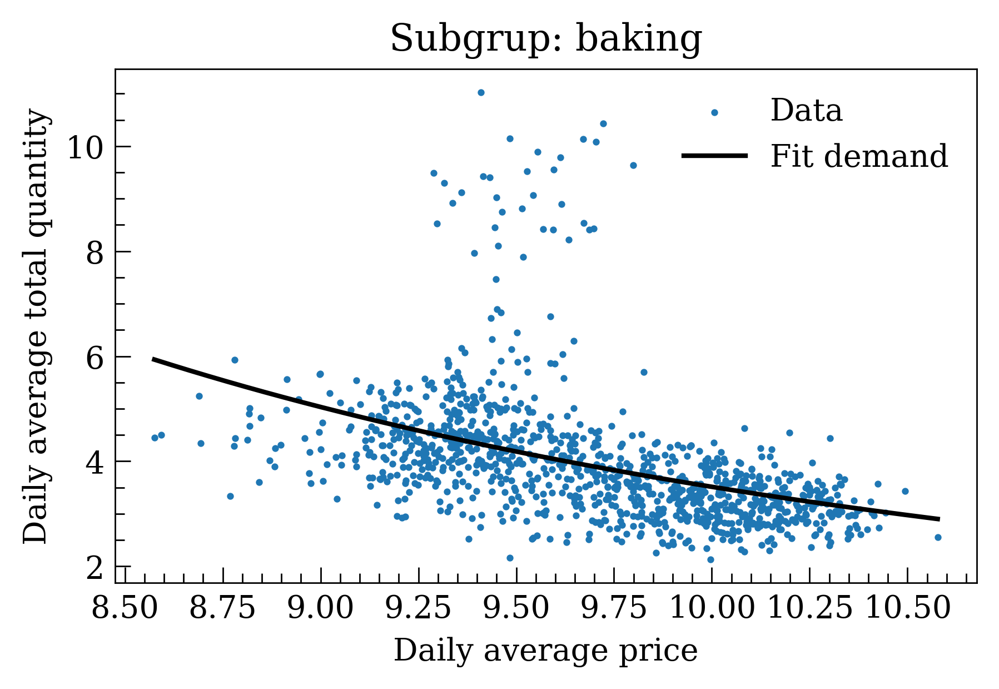

...

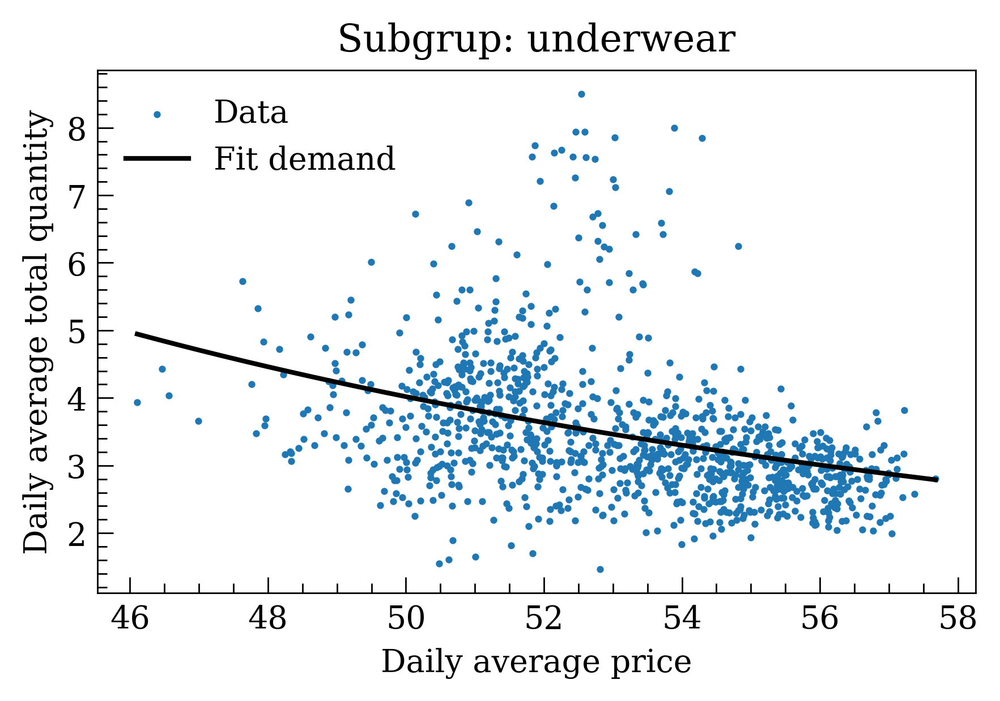

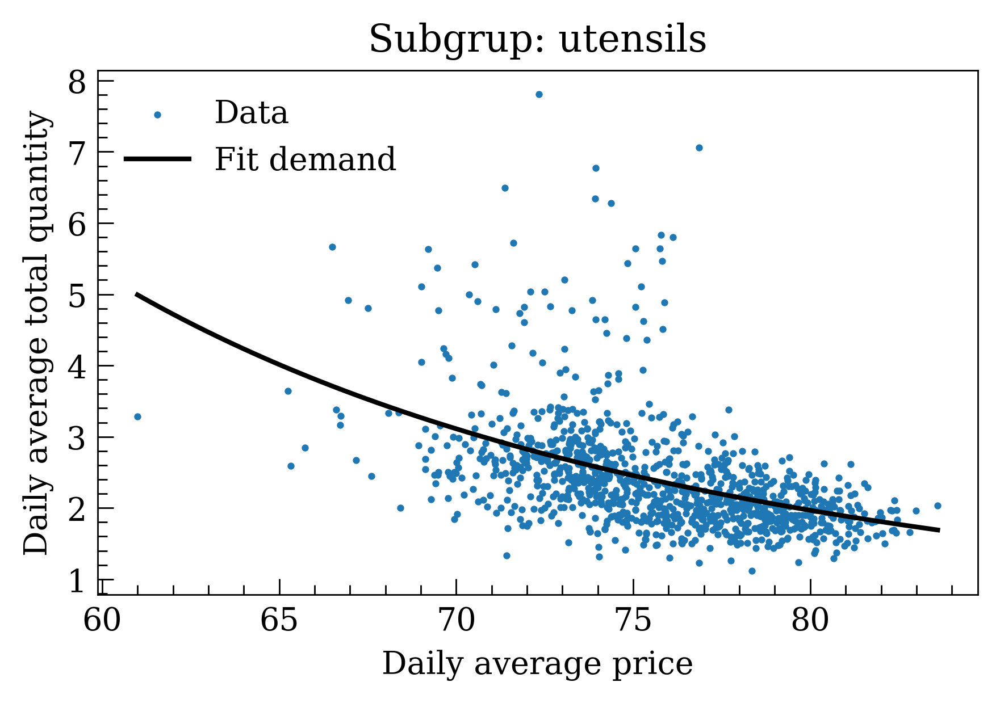

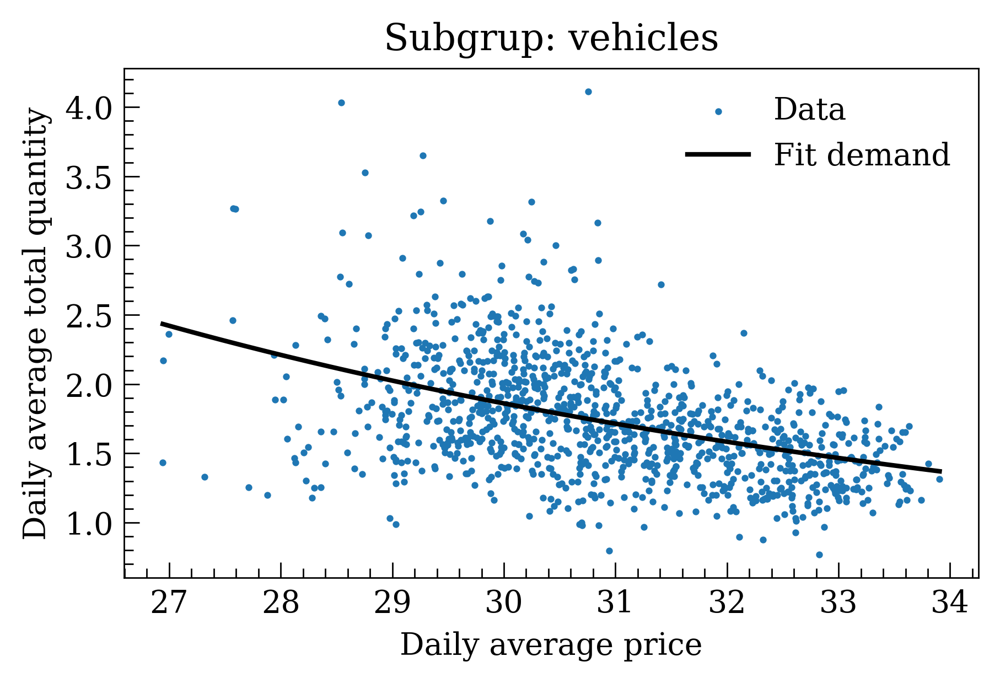

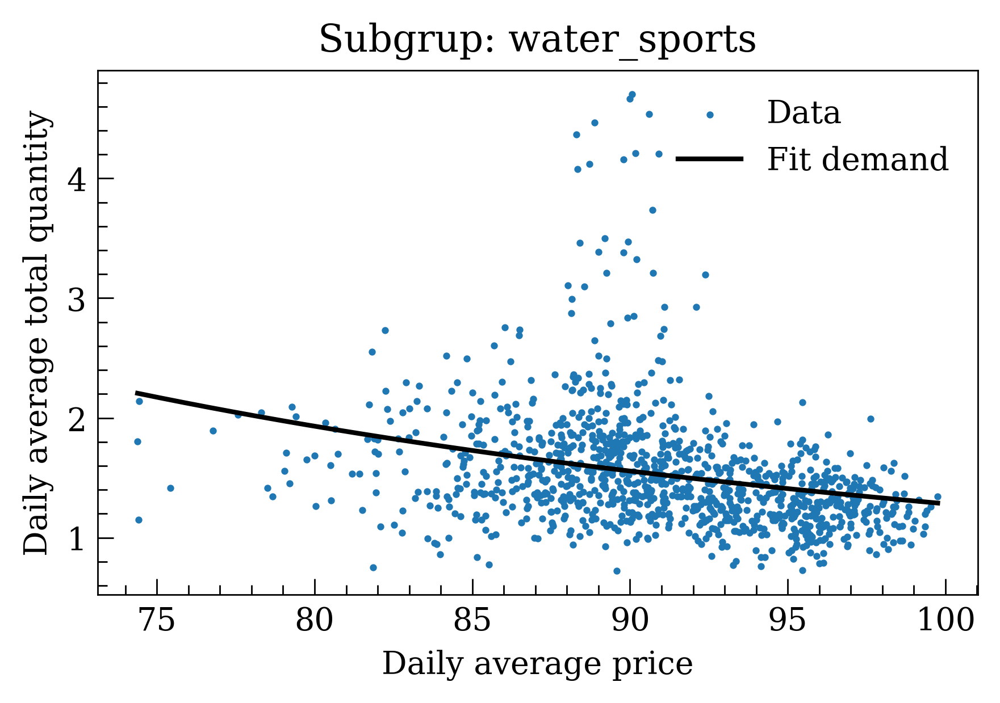

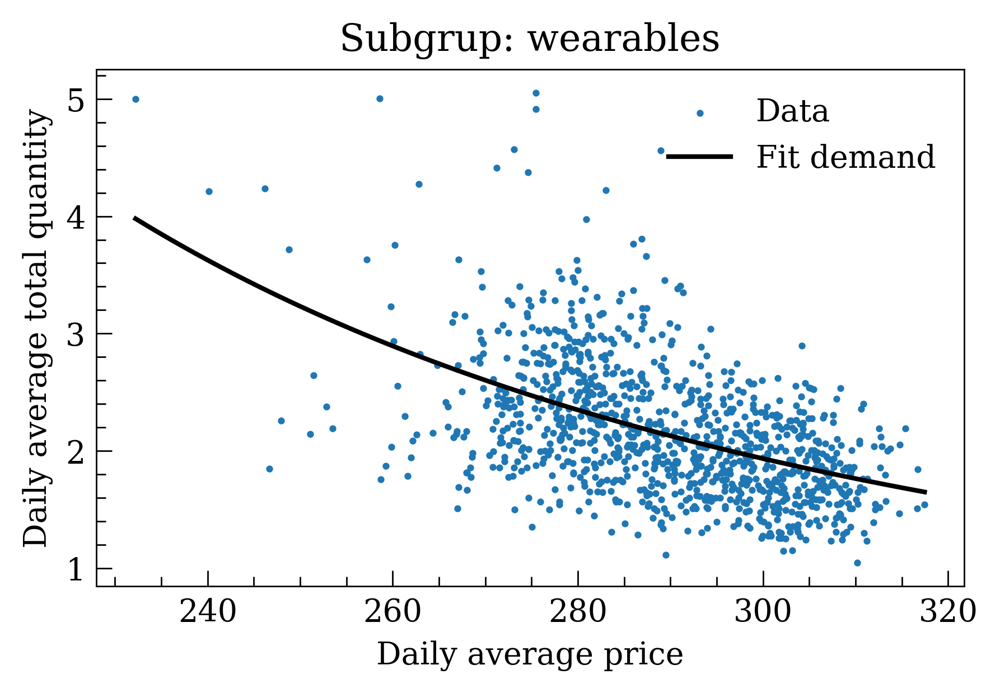

In [5]:
for sub in df_products['subgroup']:
        if sub != 'basketball':
                # Load the data
                df = pd.read_csv('../data/final_datasets/time_series/transformed_time_series/transformed_time_series_by_subgroup/{}_time_series.csv'.format(sub), 
                                index_col = 'DATE', 
                                parse_dates = True)

                # Range of prices
                p = linspace(start = df['daily_average_price'].values.min(),
                             stop = df['daily_average_price'].values.max(),
                             num = 500)
                
                Q_est = df_products.loc[df_products.loc[:, 'subgroup'] == sub, ['estimated_daily_total_average_demand']].values
                e = df_products.loc[df_products.loc[:, 'subgroup'] == sub, ['elasticity']].values
                p_base = df_products.loc[df_products.loc[:, 'subgroup'] == sub, ['base_price']].values

                fig, ax = plt.subplots(1, 1, figsize = (5, 3), dpi = 400)
                ax.scatter(df['daily_average_price'].values, df['daily_total_quantity'].values/152.0, s = 1.5, label = 'Data')
                ax.plot(p, Q(parameters = array([Q_est, e]), p = p, p_base = p_base).reshape(-1), 
                        color = 'black', label = 'Fit demand')
                ax.set_xlabel('Daily average price')
                ax.set_ylabel('Daily average total quantity')
                ax.set_title('Subgrup: {}'.format(sub))
                ax.legend()
                plt.show()

In [25]:
for n in range(df_products.shape[0]):
    print(n, (df_products.loc[n, 'base_price'] - df_products.loc[n, 'costos'])/df_products.loc[n, 'costos']*100.0)

0 40.4943499885543
1 76.76396176911545
2 102.85340884338925
3 76.75302761699308
4 29.550278588485014
5 67.9436542544691
6 82.7848593407204
7 64.13635411575788
8 112.00360271841483
9 86.71228679399451
10 86.03820701710575
11 92.5210225766812
12 72.67773845906389
13 27.71965704397075
14 102.18539063022124
15 105.97340309570527
16 27.062338583075924
17 153.41240644424715
18 27.026728517782207
19 30.614905072258438
20 38.196453433599885
21 68.19280313948074
22 89.37341815445652
23 72.52523024320301
24 152.10509982414396
25 151.57757348768584
26 95.4687160153701
27 95.38520213577422
28 37.576274198750674
29 74.18259321716322
30 113.82674620929649
31 37.20946648658569
32 88.5515003371544
33 86.39636363636363
34 25.95906795428367
35 40.414285100348074
36 101.07413445861701
37 153.17002132417952
38 71.97993365158993
39 61.866393202461175
40 160.44261191518007
41 117.3275784551749
42 27.7344427110418
43 104.35365727844837
44 83.67072918818428
45 29.306152982981086
46 85.55555555555553
47 69.023

In [33]:
# Sort values
df_products.sort_values(by = ['elasticity'], ascending = True, inplace = True)

for sub, e in zip(df_products['subgroup'], df_products['elasticity']):
    print(sub.capitalize(), e)

Cleansers -3.964681446381889
Utensils -3.434783317931317
Baking -3.4133751224341933
Canned_goods -3.38997040843023
Moisturizers -3.169602152721897
Chips -3.1227628568363883
Boys -3.117822830047151
Outerwear -3.1094755342832734
Shirts -3.101326743757653
Bedroom -3.053835778994894
Pasta -3.015188991542445
Infants -3.0100612943072846
Pots_and_pans -2.9881746674468985
History -2.9629545809578373
Desktops -2.894040827160566
Nuts -2.8621149863950848
Tops -2.8280931097554336
Wearables -2.8187285110175573
Treatment -2.800210393498432
Treatments -2.780956309616097
Bottoms -2.775409858278593
Cookies -2.7428402614314025
Styling -2.7026876728624387
Figures -2.6863433518181887
Science_fiction -2.66177521630077
Apparel -2.602779984746448
Pants -2.5971167281063328
Accessories -2.584396450939352
Underwear -2.556924992691304
Vehicles -2.498145052134812
Playsets -2.4859658656813792
Biography -2.483566597987192
Girls -2.4591725820519343
Specialty -2.4530267270091173
Arts_and_crafts -2.4461570249632407
Bo

In [48]:
df_submission = pd.read_csv('../data/submissions/submission_final.csv')

In [49]:
df_submission.describe()

,TOTAL_SALES,OPTIMAL_PRICE,ADDED_VALUE,PROFIT,ELASTICITY
count,77700.000000,77700.000000,77700.000000,77700.000000,77700.000000
mean,259.694635,63.063168,31.553022,82.630598,-2.374974
std,267.711315,95.021602,32.159468,107.807090,0.598764
min,38.007704,8.277261,10.000000,4.010043,-3.964681
25%,102.458672,16.815333,10.000000,23.164237,-2.800210
50%,159.568483,32.264213,16.707228,53.942750,-2.373534
75%,288.550763,58.400222,40.466142,85.177435,-2.005691
max,1101.849291,731.446866,224.226821,700.502492,-0.460185
